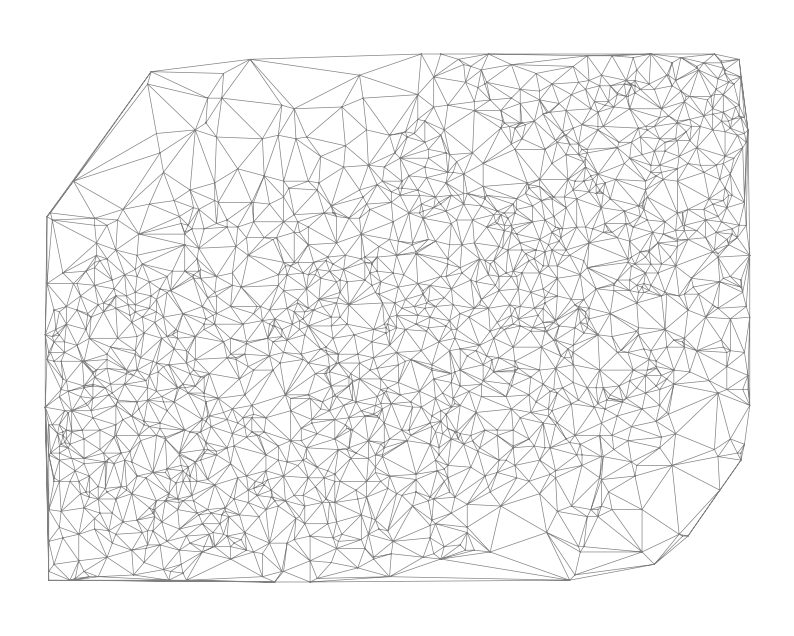

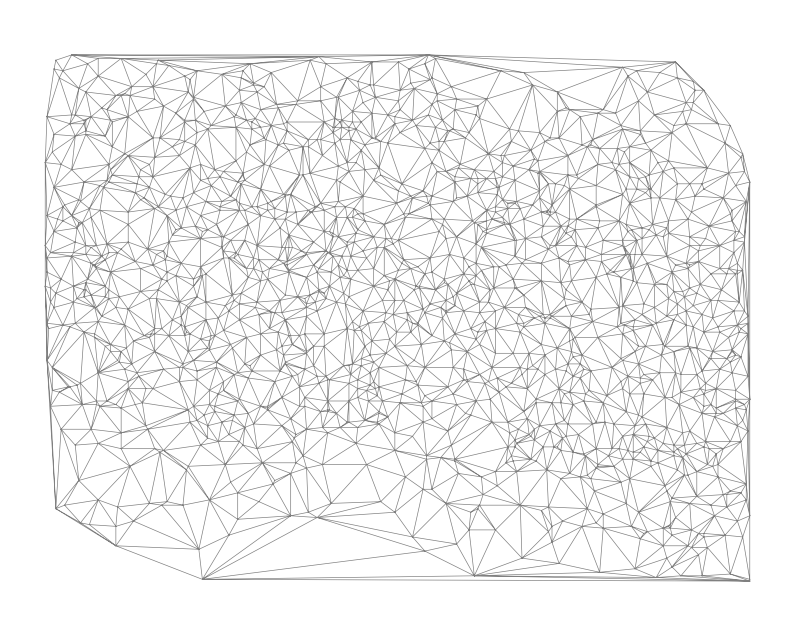

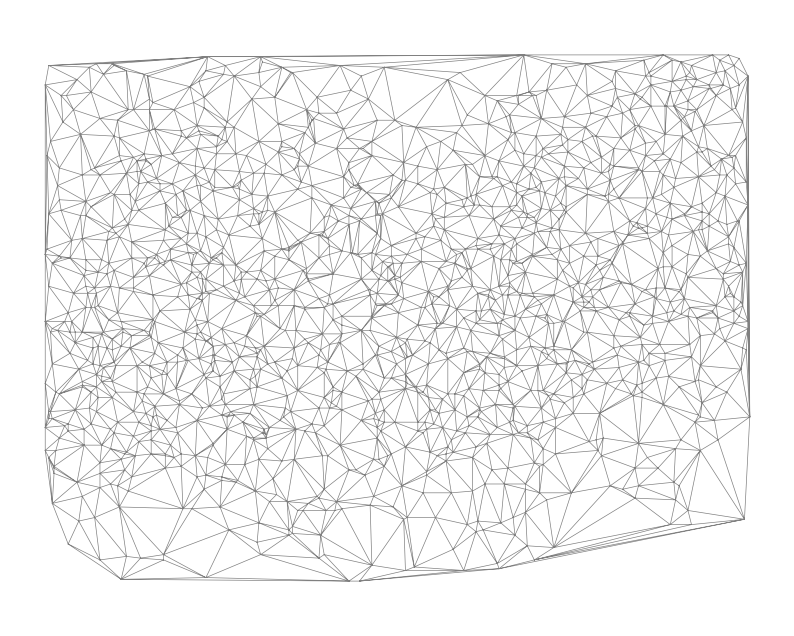

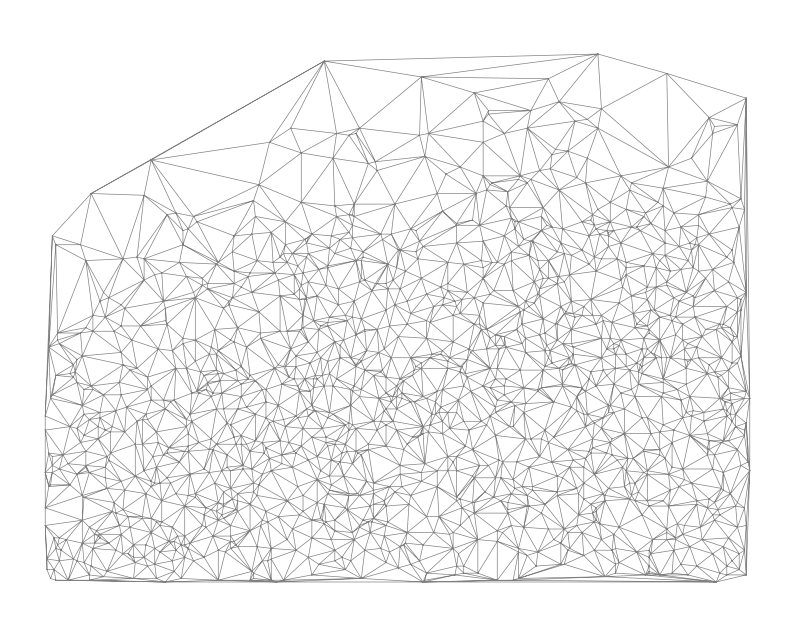

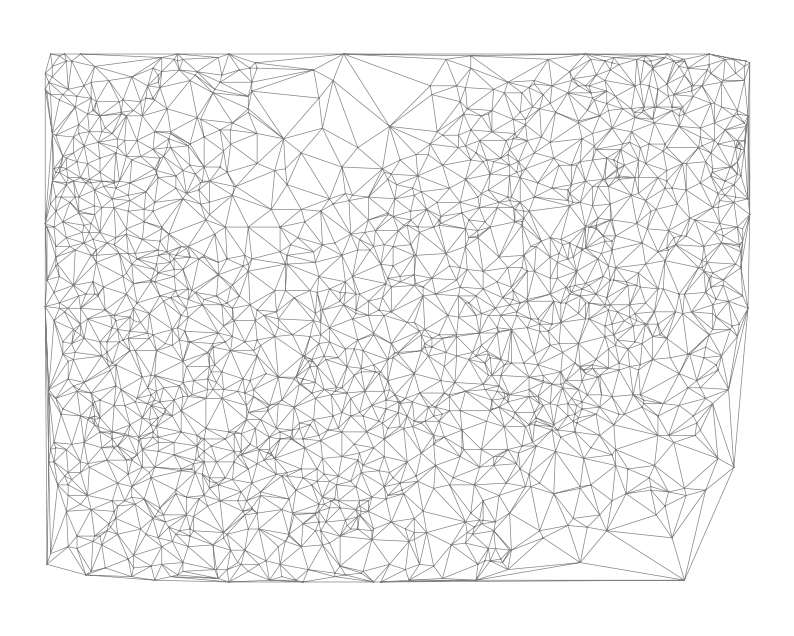

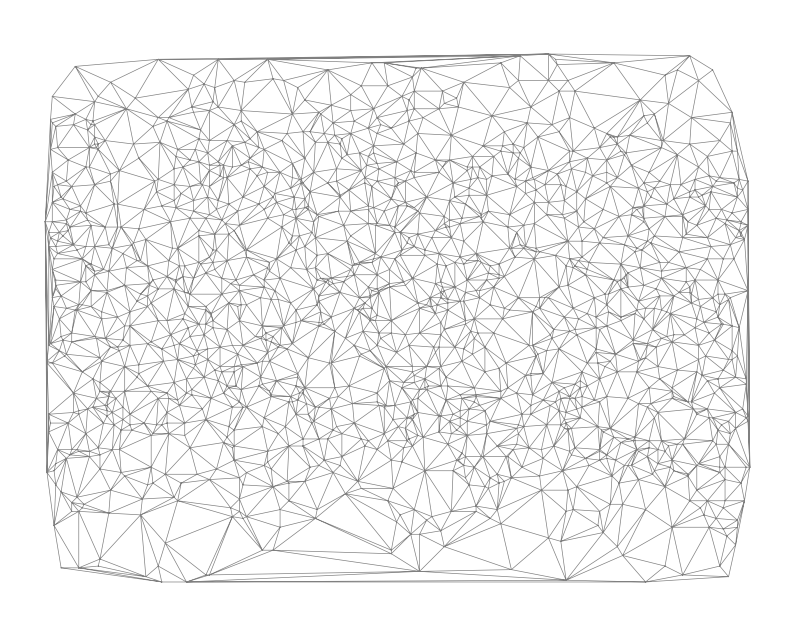

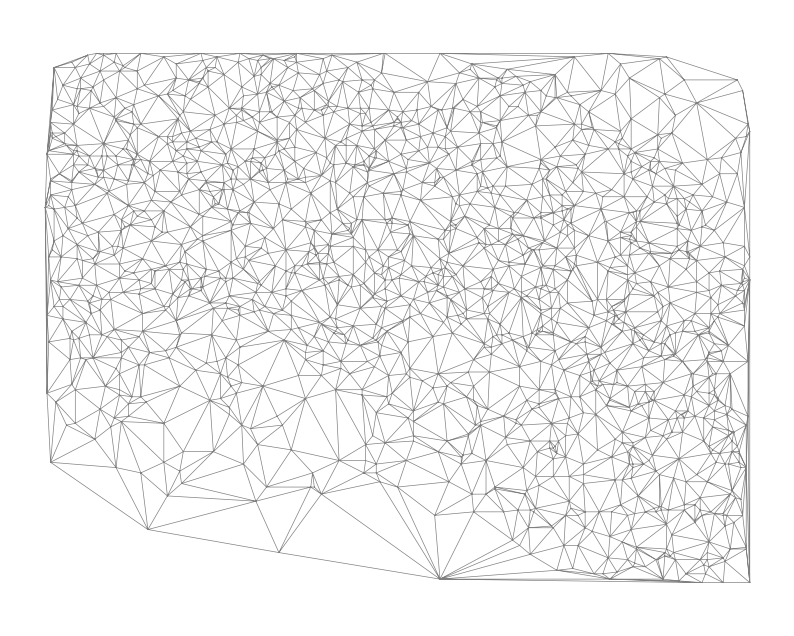

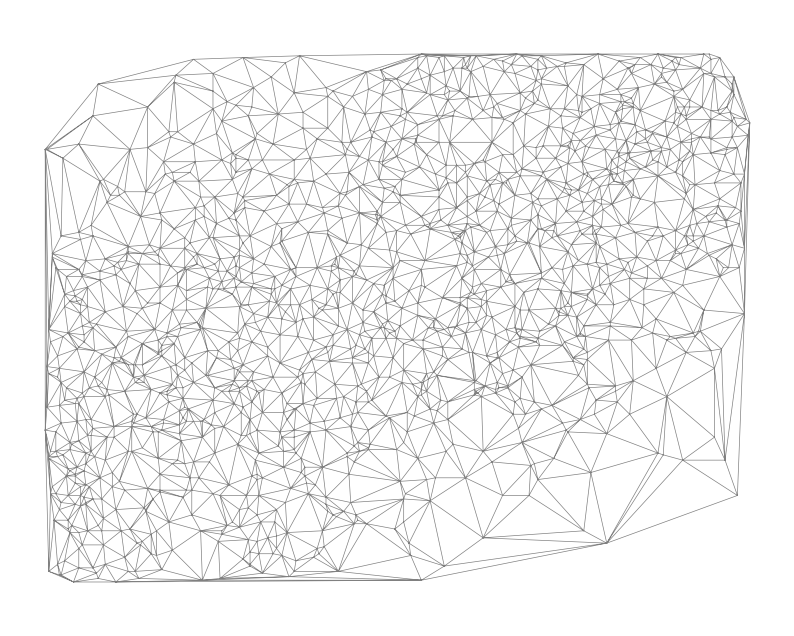

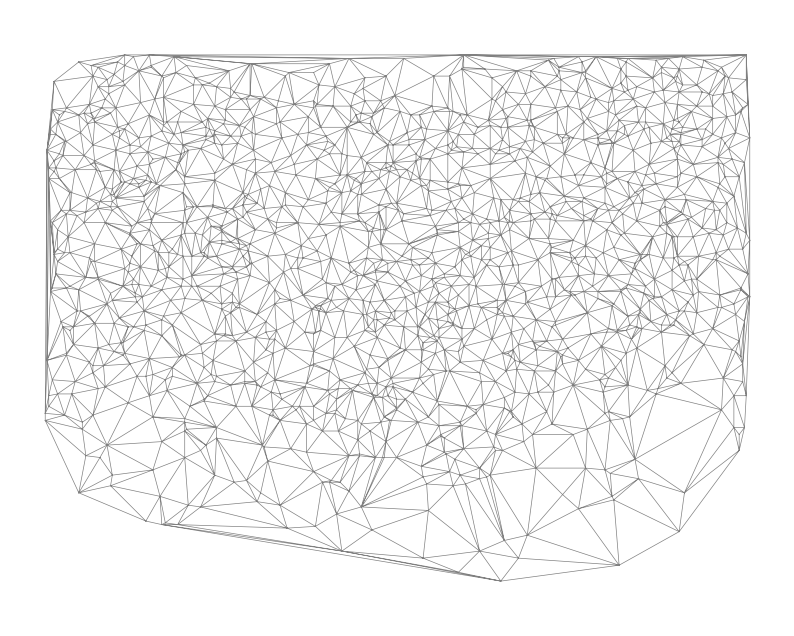

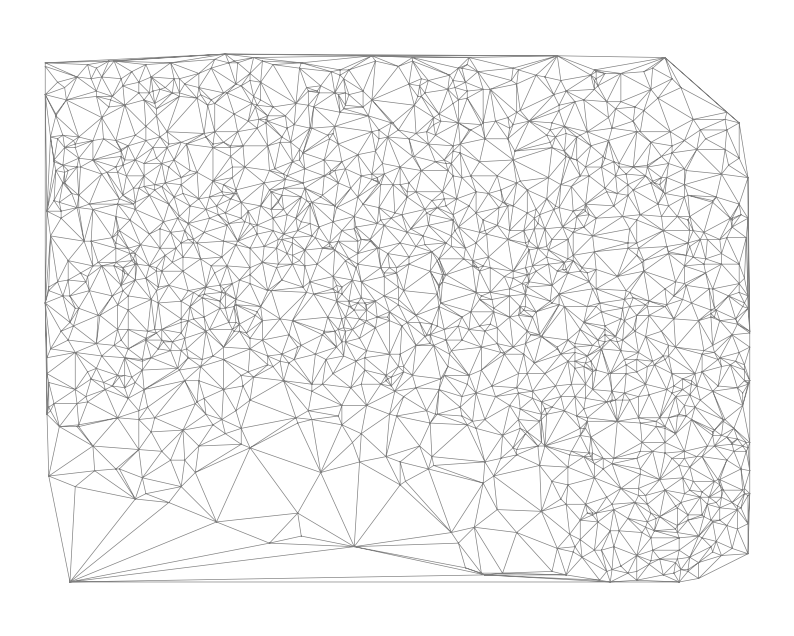

In [18]:
import numpy as np
from scipy.spatial import Delaunay
import matplotlib.pyplot as plt
import random
from scipy.interpolate import CubicSpline

def distance(x1, y1, x2, y2):
    """Calculates the Euclidean distance between two points."""
    return np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

def softstep(x, slope=1.0):
    """Softstep function for smooth transitions."""
    return (1 / (1 + np.exp(-slope * (x - 0.5))))

def point_to_curve_distance(px, py, t_values, curve_x, curve_y):
    """Calculate the minimum distance from a point to a curve."""
    px = np.asarray(px)
    py = np.asarray(py)
    
    min_distance = np.full(px.shape, np.inf)
    for t in t_values:
        cx, cy = curve_x(t), curve_y(t)
        d = distance(px, py, cx, cy)
        min_distance = np.minimum(min_distance, d)
    return min_distance

def sort_points_by_x(points):
    """Sort points by their x values."""
    return sorted(points, key=lambda p: p[0])

def generate_random_points(width, height, points, max_distance, probability_coef):
    """Generate random points with a density gradient close to the specified curve."""
    t_values_points = np.linspace(0, 1, num=len(points))

    points_x = [p[0] for p in points]
    points_y = [p[1] for p in points]

    cx = CubicSpline(t_values_points, points_x)
    cy = CubicSpline(t_values_points, points_y)

    x, y = np.meshgrid(np.arange(width), np.arange(height))
    x = x.flatten()
    y = y.flatten()

    t_values = np.linspace(0, 1, num=500)
    point_distance = point_to_curve_distance(x, y, t_values, cx, cy)
    
    normalized_distance = point_distance / max_distance
    softstep_distance = softstep(normalized_distance, slope=8.0)  
    probabilities = 1 - np.clip(softstep_distance, 0, 1)

    random_values = np.random.rand(len(probabilities))
    dots = random_values < probabilities * probability_coef  # Lower probability of dot generation

    return np.column_stack((x[dots], y[dots]))

for i in range(10):

    # Parameters
    width, height = 400, 300

    # generate points for curve
    points = [(0, random.randint(0, height)), 
              (random.randint(int(width/4), int(width*3/4)), 
               random.randint(int(height/4), int(height*3/4))), 
              (width, random.randint(0, height))]

                                                                                 
    sorted_points = sort_points_by_x(points.copy())
    
    max_distance = 200
    probability_coef = 0.02
    
    # Generate random points
    random_points = generate_random_points(width, height, sorted_points, max_distance, probability_coef)
    
    # Create Delaunay triangulation
    tri = Delaunay(random_points)
    
    # Plot
    plt.figure(figsize=(10, 8))
    plt.triplot(random_points[:, 0], random_points[:, 1], tri.simplices, color='gray', linewidth=0.5)
    # plt.scatter(random_points[:, 0], random_points[:, 1], color='red', s=2)
    plt.axis('equal')
    plt.axis('off')
    
    plt.savefig("figure/standard_"+ str(i) +".png")
    plt.show()

# Slight shading

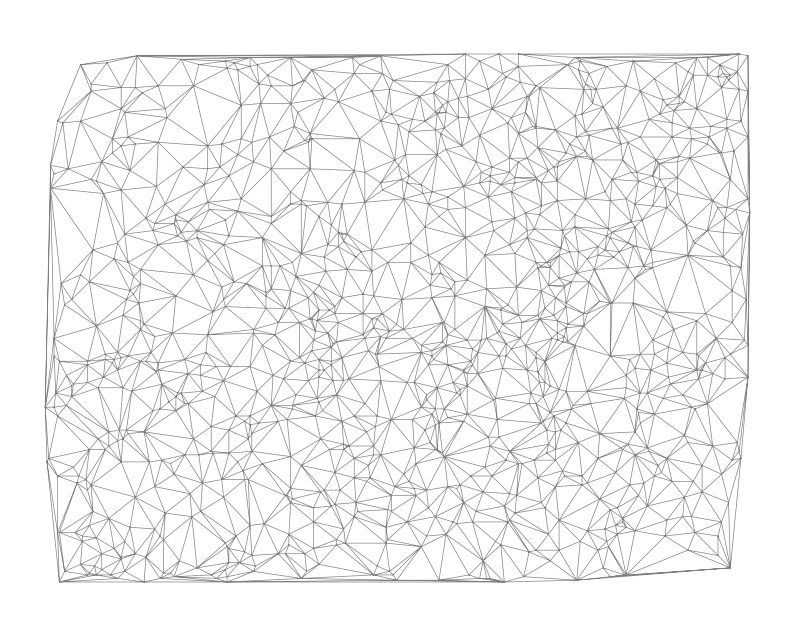

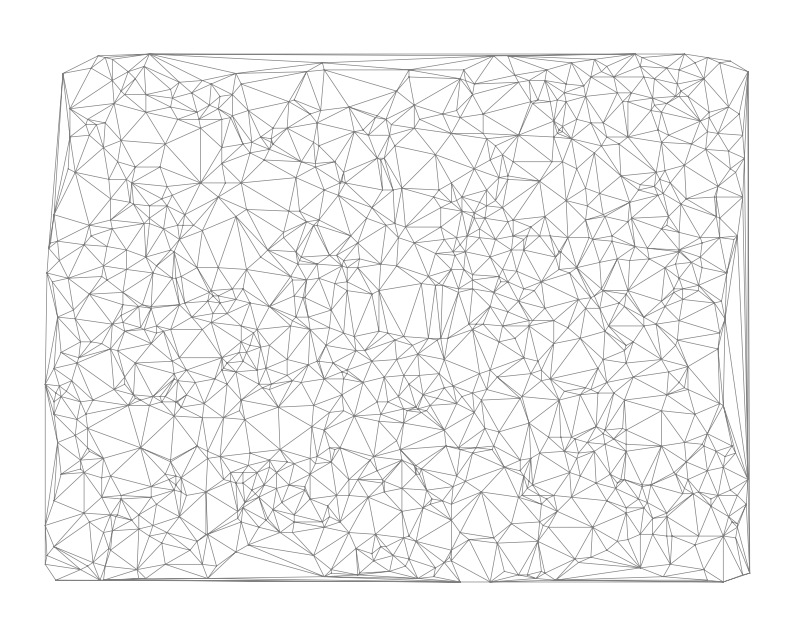

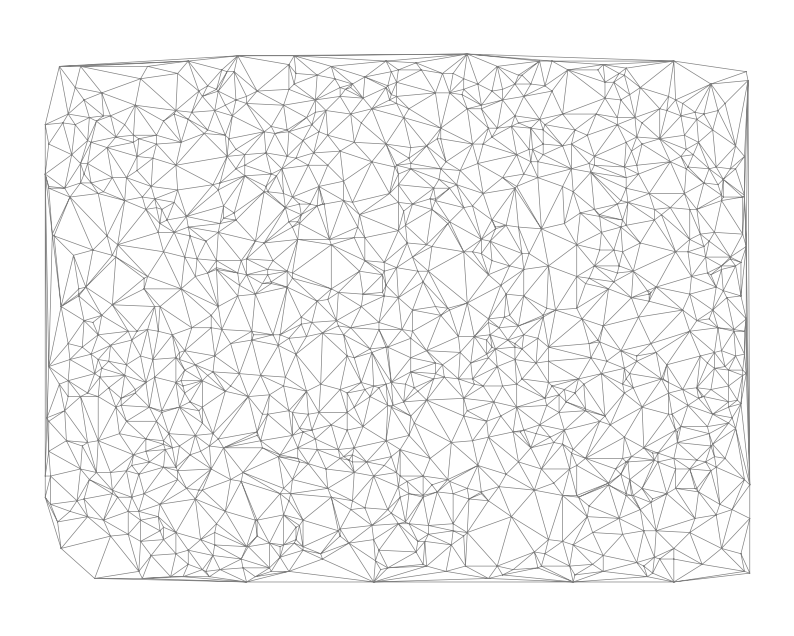

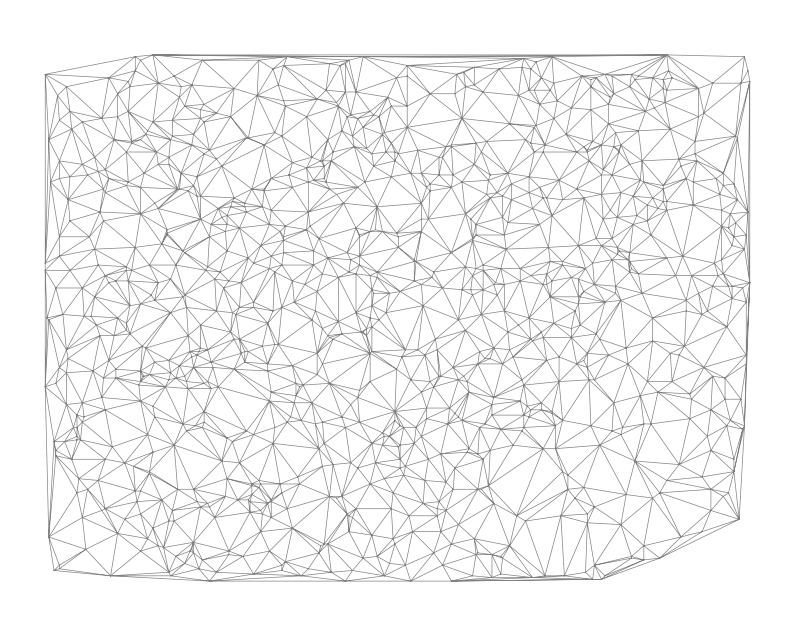

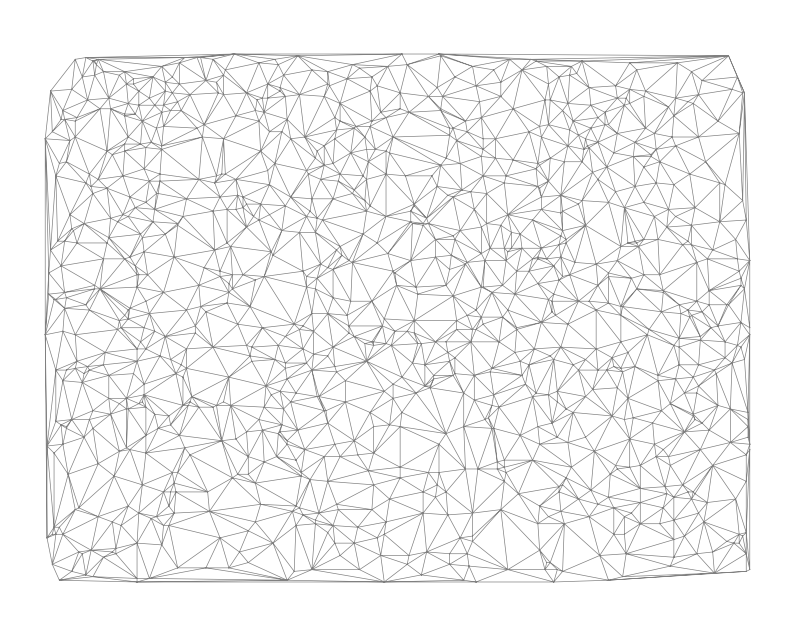

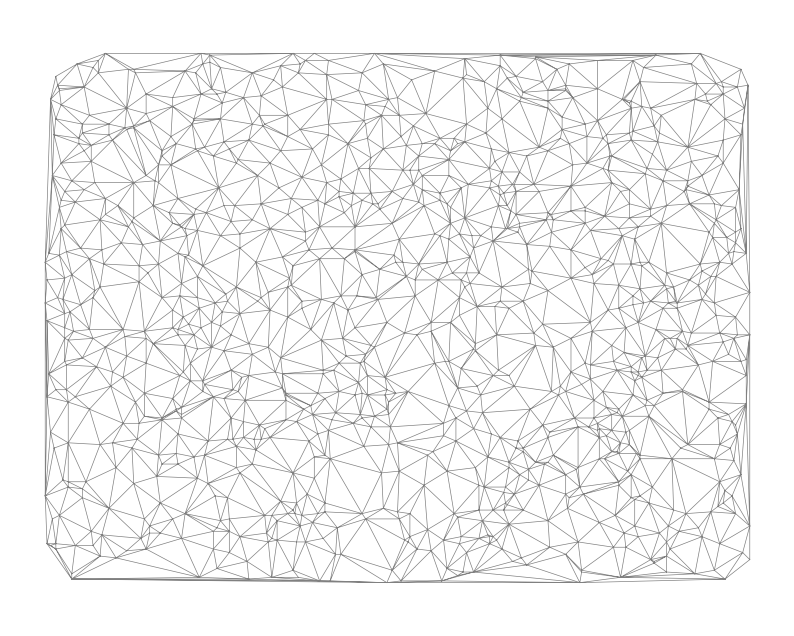

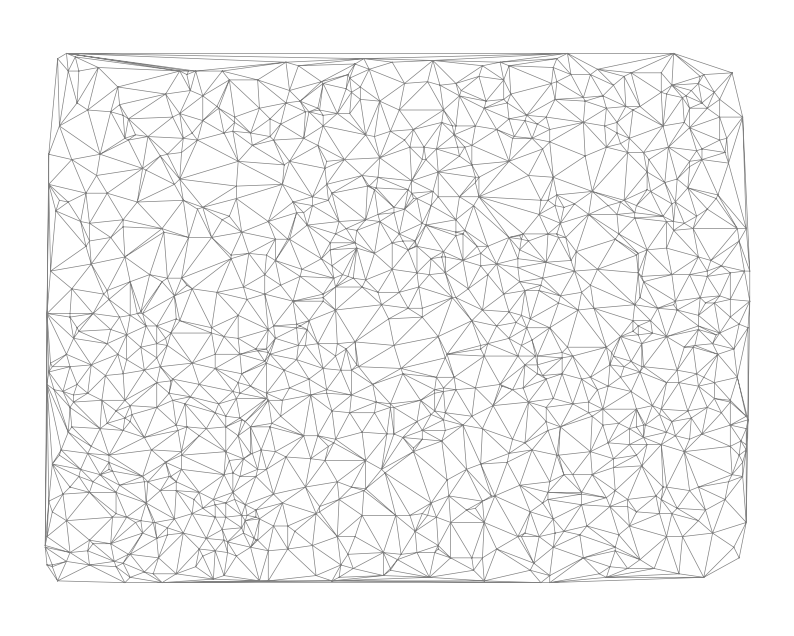

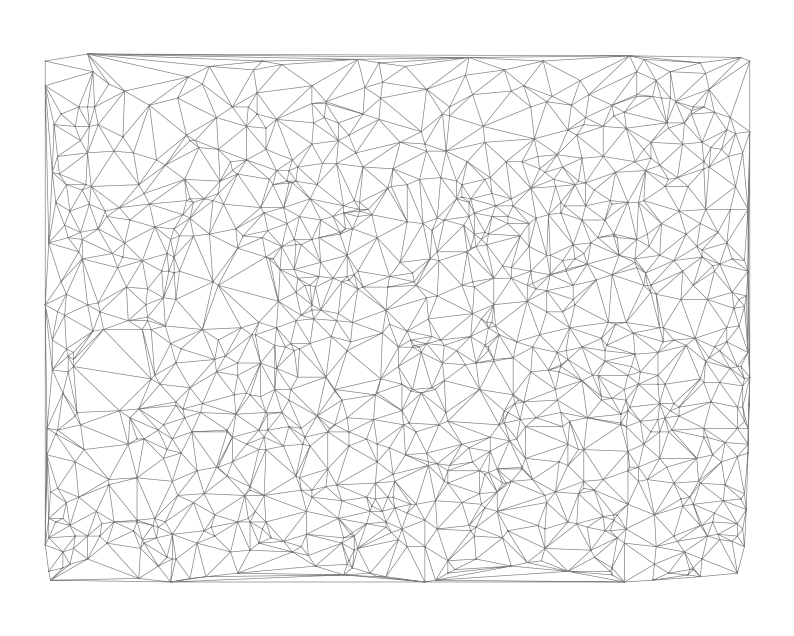

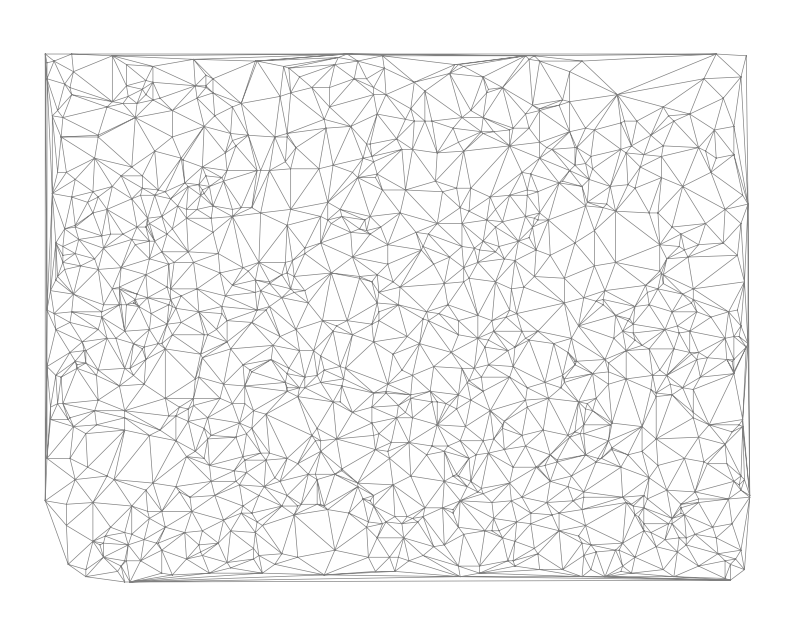

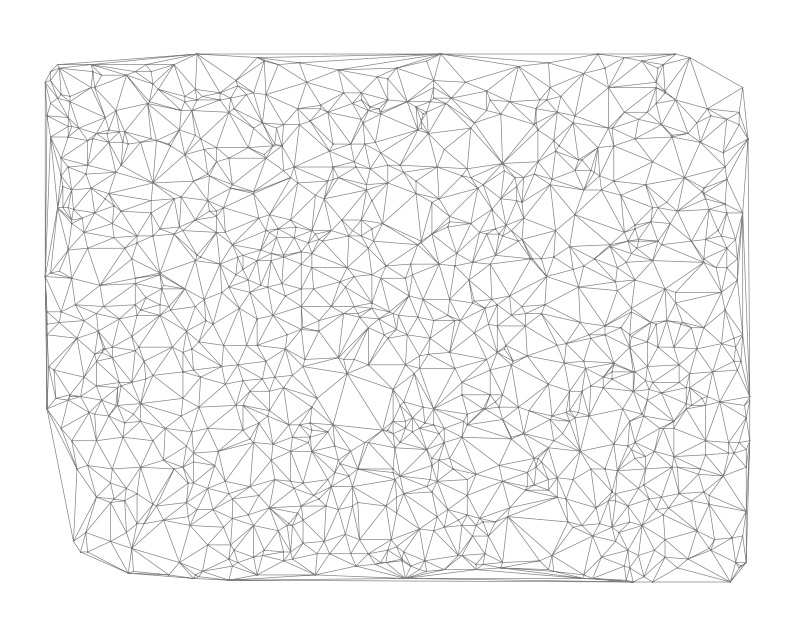

In [19]:
for i in range(10):

    # Parameters
    width, height = 400, 300

    # generate points for curve
    points = [(0, random.randint(0, height)), 
              (random.randint(int(width/4), int(width*3/4)), 
               random.randint(int(height/4), int(height*3/4))), 
              (width, random.randint(0, height))]

                                                                                 
    sorted_points = sort_points_by_x(points.copy())
    
    max_distance = 400
    probability_coef = 0.01
    
    # Generate random points
    random_points = generate_random_points(width, height, sorted_points, max_distance, probability_coef)
    
    # Create Delaunay triangulation
    tri = Delaunay(random_points)
    
    # Plot
    plt.figure(figsize=(10, 8))
    plt.triplot(random_points[:, 0], random_points[:, 1], tri.simplices, color='gray', linewidth=0.5)
    # plt.scatter(random_points[:, 0], random_points[:, 1], color='red', s=2)
    plt.axis('equal')
    plt.axis('off')
    
    plt.savefig("figure/SlightShading_"+ str(i) +".png")
    plt.show()

# Many Points

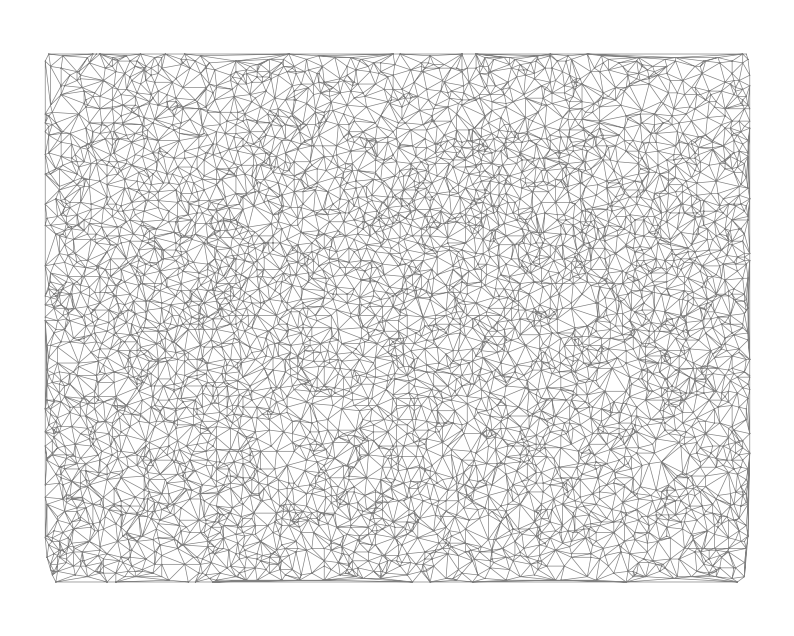

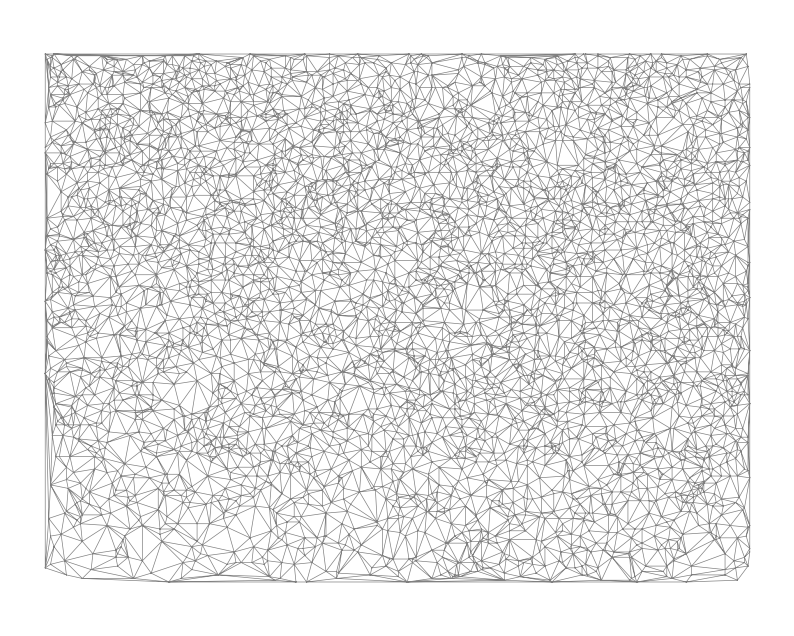

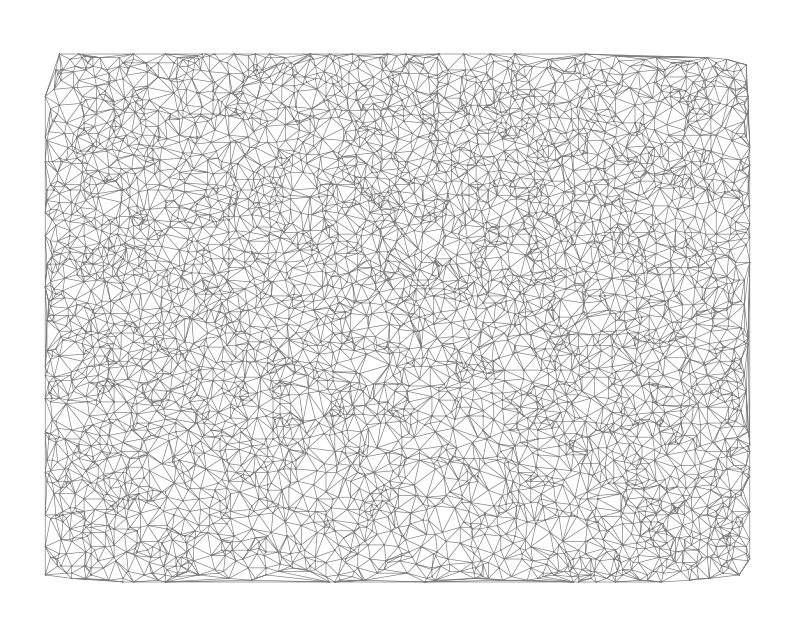

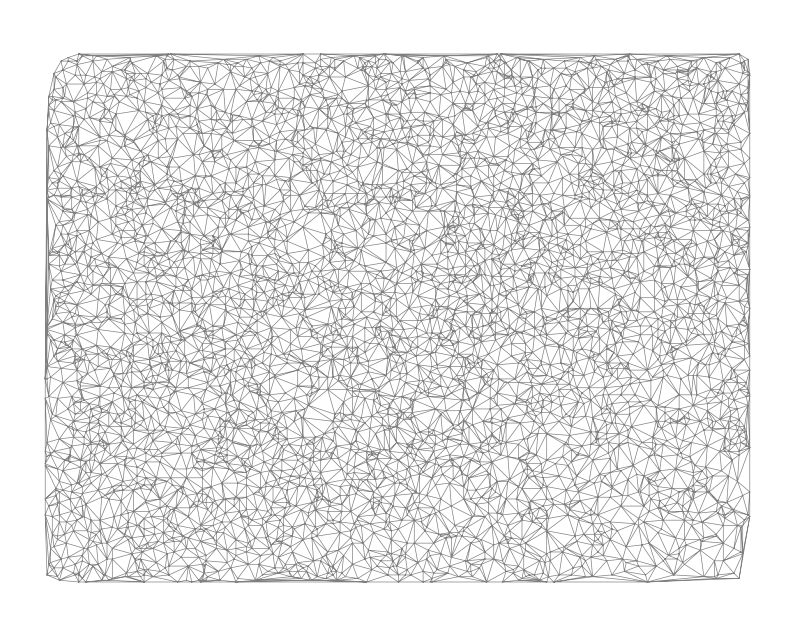

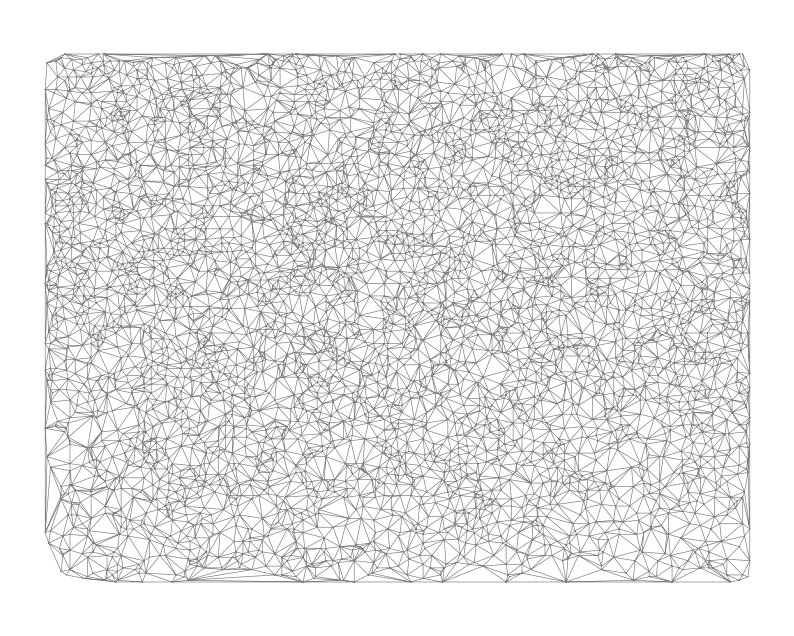

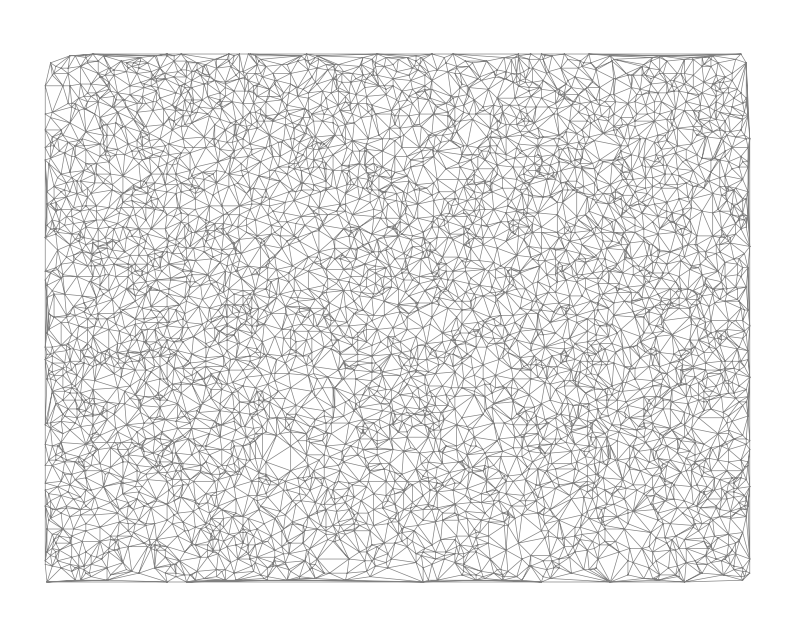

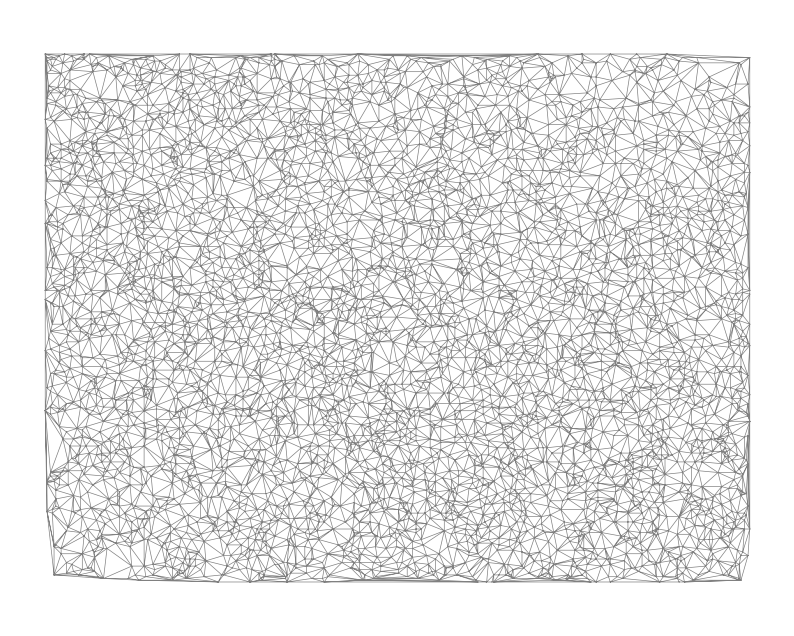

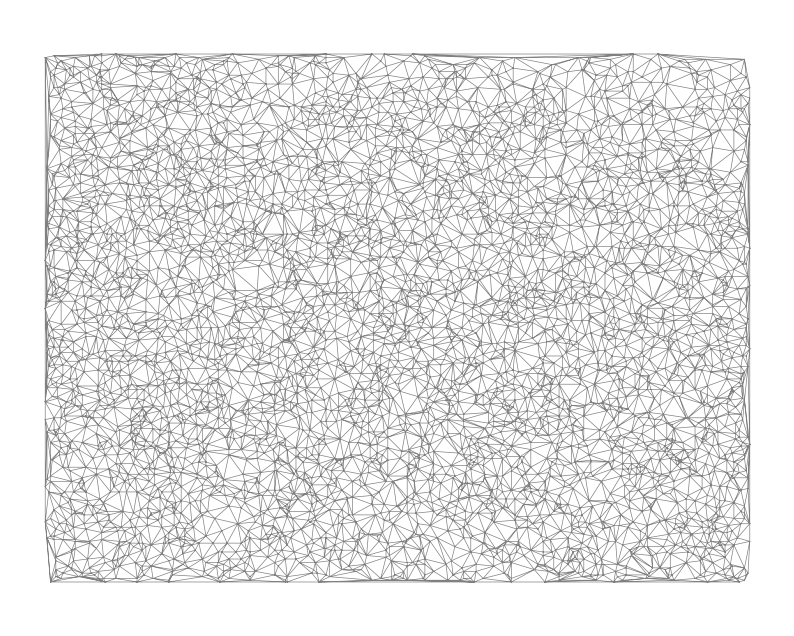

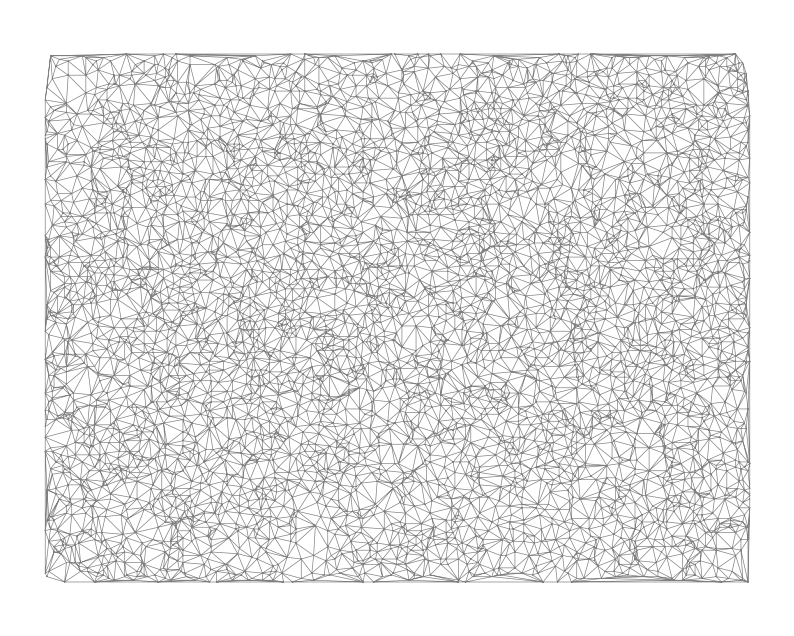

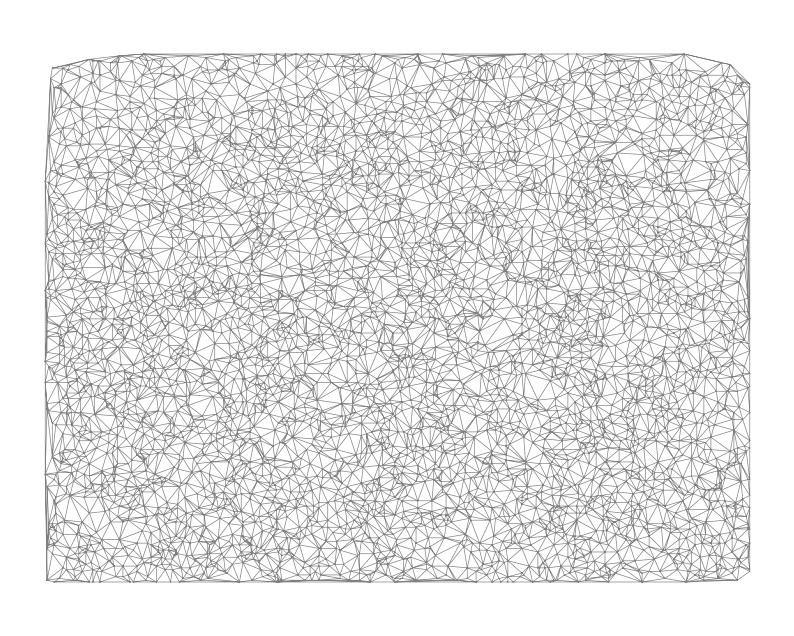

In [17]:
for i in range(10):

    # Parameters
    width, height = 400, 300

    # generate points for curve
    points = [(0, random.randint(0, height)), 
              (random.randint(int(width/4), int(width*3/4)), 
               random.randint(int(height/4), int(height*3/4))), 
              (width, random.randint(0, height))]

                                                                                 
    sorted_points = sort_points_by_x(points.copy())
    
    max_distance = 400
    probability_coef = 0.05
    
    # Generate random points
    random_points = generate_random_points(width, height, sorted_points, max_distance, probability_coef)
    
    # Create Delaunay triangulation
    tri = Delaunay(random_points)
    
    # Plot
    plt.figure(figsize=(10, 8))
    plt.triplot(random_points[:, 0], random_points[:, 1], tri.simplices, color='gray', linewidth=0.5)
    # plt.scatter(random_points[:, 0], random_points[:, 1], color='red', s=2)
    plt.axis('equal')
    plt.axis('off')
    
    plt.savefig("figure/many_points_"+ str(i) +".png")
    plt.show()

# A few points

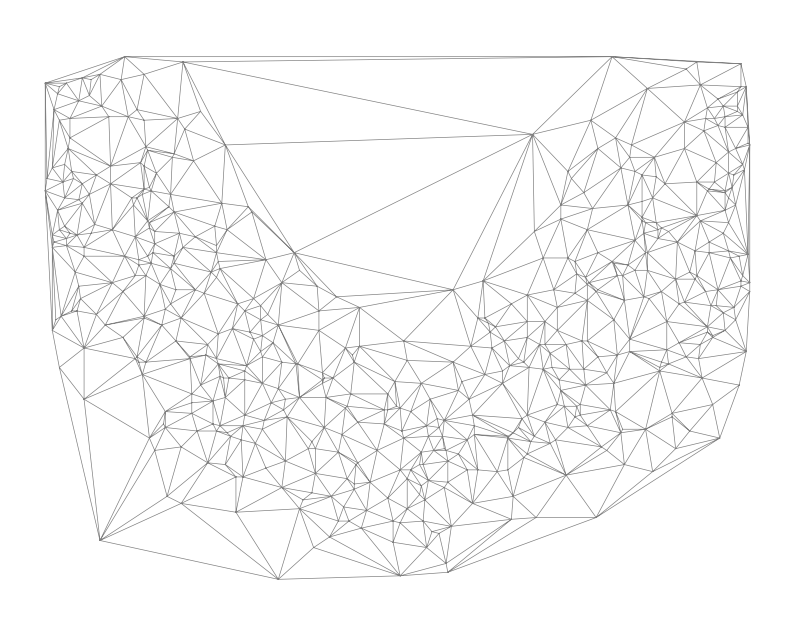

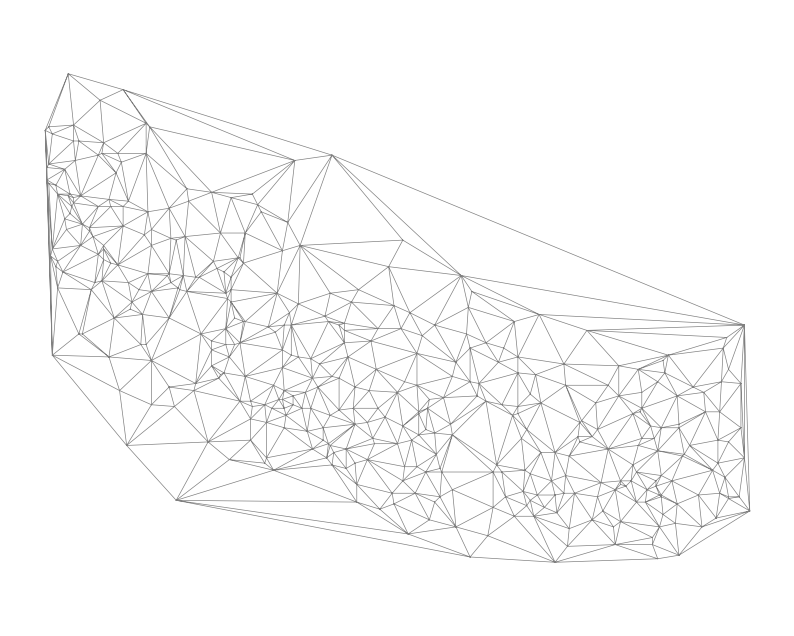

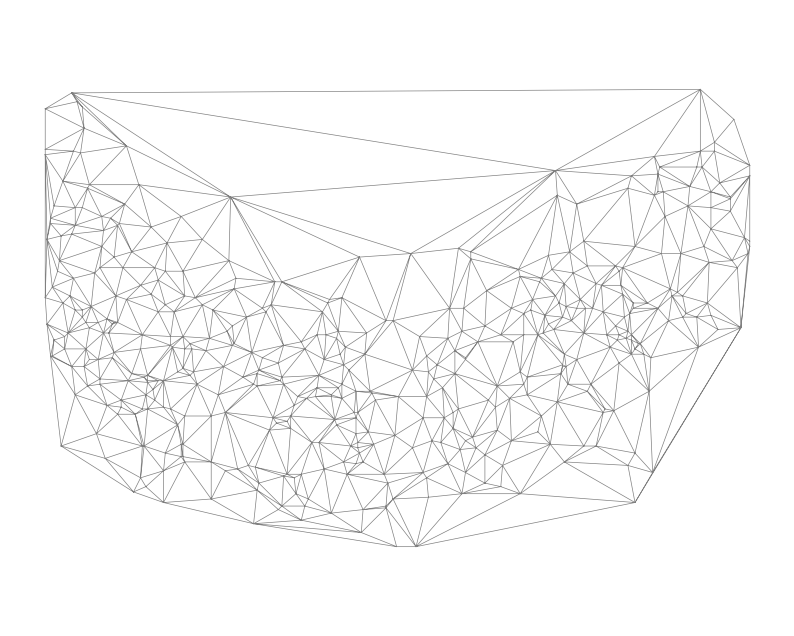

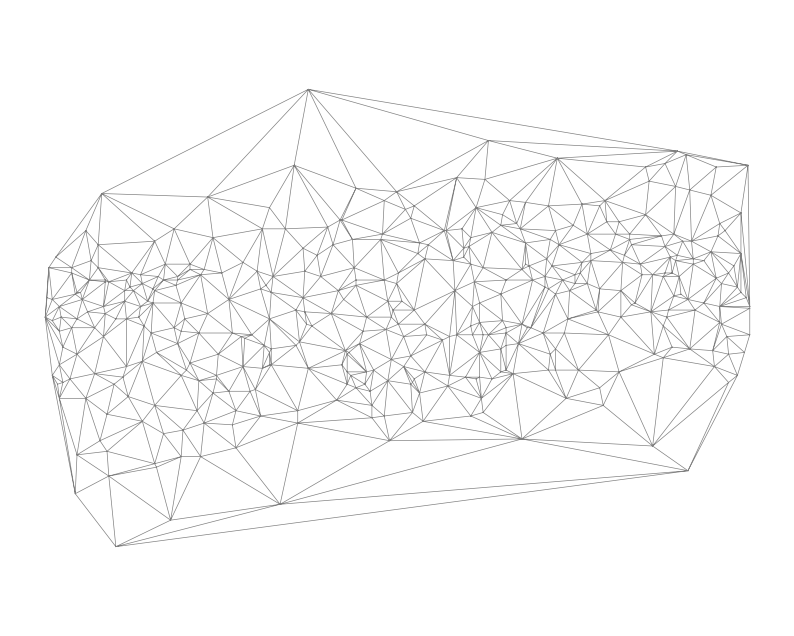

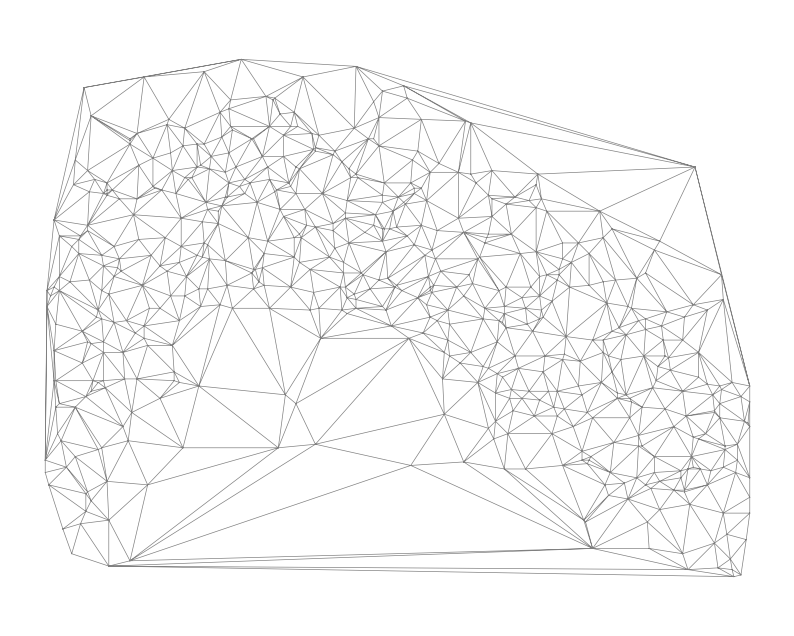

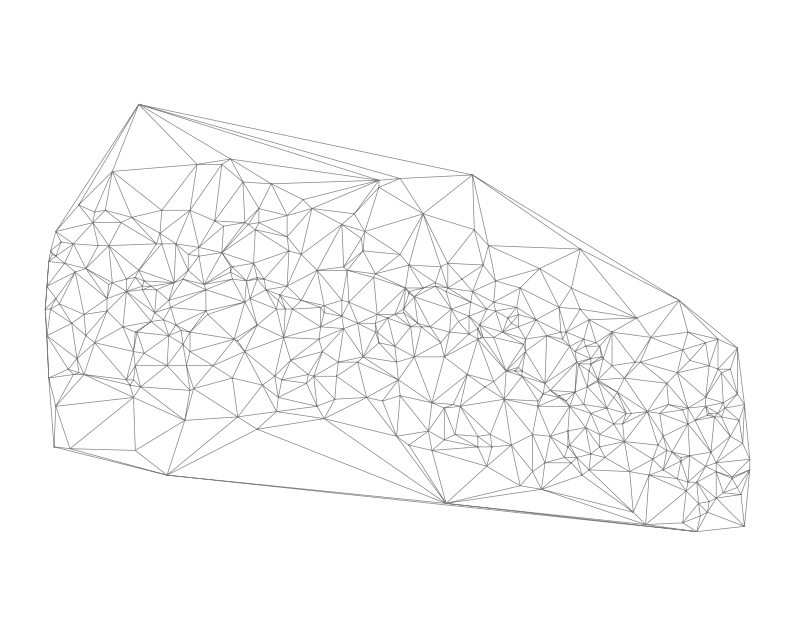

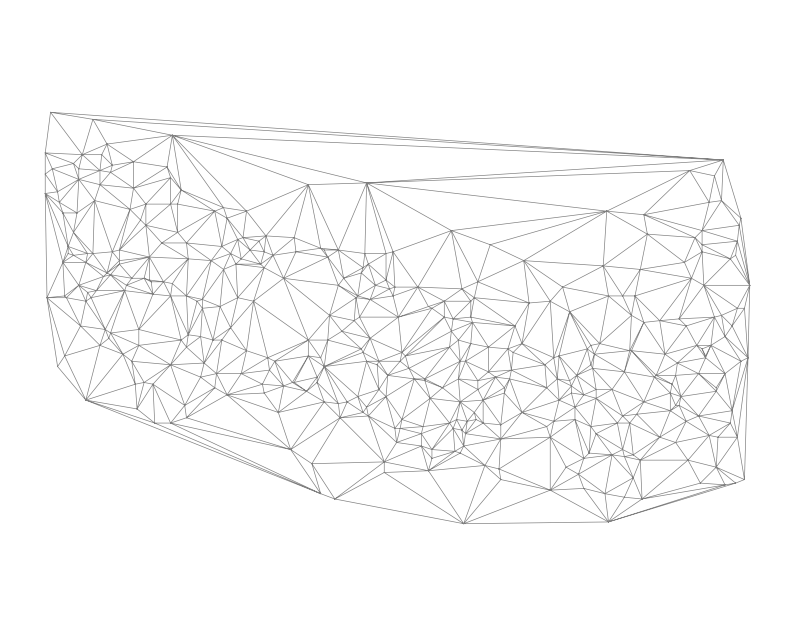

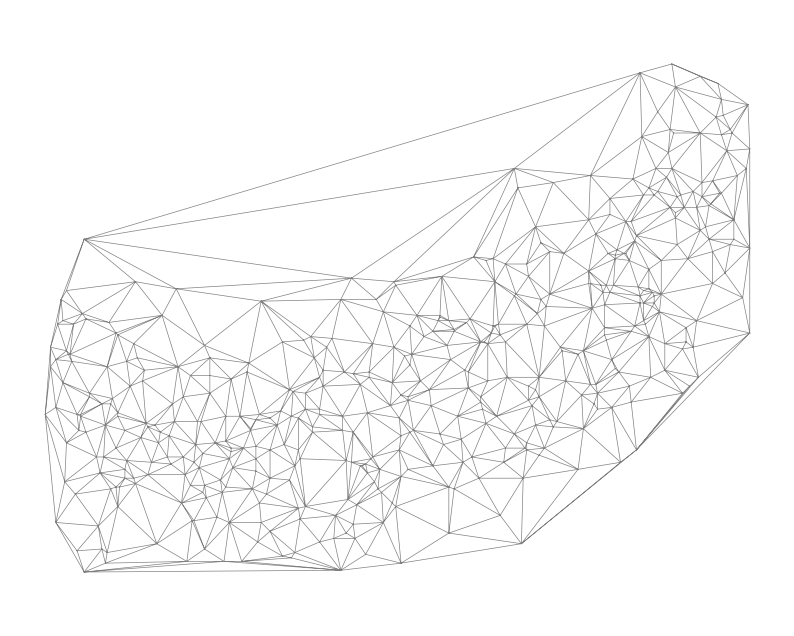

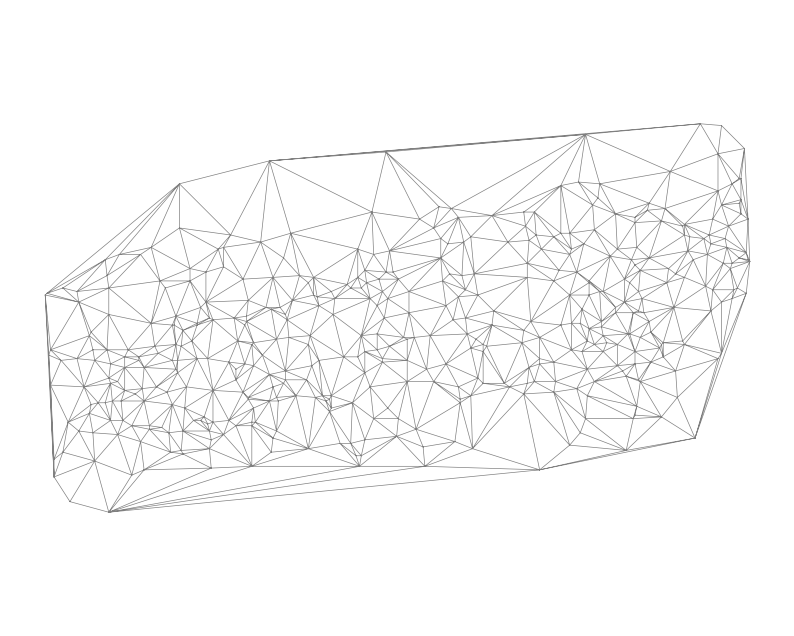

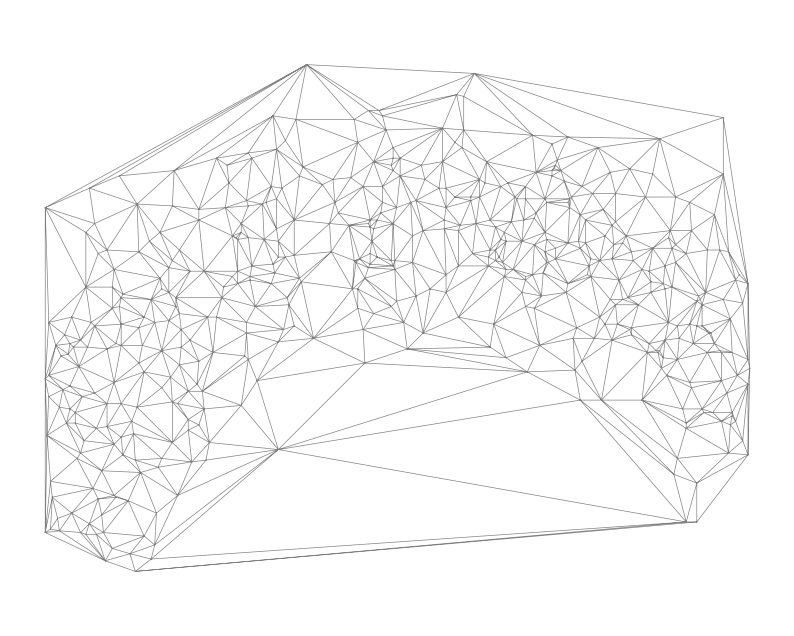

In [20]:
for i in range(10):

    # Parameters
    width, height = 400, 300

    # generate points for curve
    points = [(0, random.randint(0, height)), 
              (random.randint(int(width/4), int(width*3/4)), 
               random.randint(int(height/4), int(height*3/4))), 
              (width, random.randint(0, height))]

                                                                                 
    sorted_points = sort_points_by_x(points.copy())
    
    max_distance = 100
    probability_coef = 0.01
    
    # Generate random points
    random_points = generate_random_points(width, height, sorted_points, max_distance, probability_coef)
    
    # Create Delaunay triangulation
    tri = Delaunay(random_points)
    
    # Plot
    plt.figure(figsize=(10, 8))
    plt.triplot(random_points[:, 0], random_points[:, 1], tri.simplices, color='gray', linewidth=0.5)
    # plt.scatter(random_points[:, 0], random_points[:, 1], color='red', s=2)
    plt.axis('equal')
    plt.axis('off')
    
    plt.savefig("figure/few_points_"+ str(i) +".png")
    plt.show()